In [1]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.1/660.1 kB 4.3 MB/s eta 0:00:00


In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="XR2ZyjOJoAJafsFuGlxQ")
project = rf.workspace("universitas-lampung").project("ban-udah-bang")
dataset = project.version(1).download("yolov8")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 722.8 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.6 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully unins

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.225, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to ban-udah-bang-1 in yolov8:: 100%|██████████| 319/319 [00:00<00:00, 1557.73it/s]


In [3]:
#@title Select YOLOv8 🚀 logger {run: 'auto'}
logger = 'TensorBoard' #@param ['Comet', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir .

<IPython.core.display.Javascript object>

In [4]:
%%writefile /content/data.yaml
# Create Custom Dataset Configuration
train: '/content/ban-udah-bang-1/train/images'
val: '/content/ban-udah-bang-1/valid/images'

nc: 1

names: [
  'pengendara-motor'

]

Writing /content/data.yaml


In [5]:
from ultralytics import YOLO

#model = YOLO()
model = YOLO("yolov8n.pt")
# the data.yaml file
model.train(data='/content/data.yaml', epochs=100, batch=16)

100%|██████████| 6.23M/6.23M [00:00<00:00, 35.2MB/s]


Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, 

100%|██████████| 755k/755k [00:00<00:00, 16.2MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/ban-udah-bang-1/train/labels... 124 images, 0 backgrounds, 0 corrupt: 100%|██████████| 124/124 [00:00<00:00, 1355.39it/s]

train: New cache created: /content/ban-udah-bang-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/ban-udah-bang-1/valid/labels... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [00:00<00:00, 852.57it/s]

val: New cache created: /content/ban-udah-bang-1/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100       2.4G      1.193      2.607      1.738         30        640: 100%|██████████| 8/8 [00:07<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.62s/it]

                   all         31         31    0.00333          1      0.573      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.25G      1.002       1.77       1.54         34        640: 100%|██████████| 8/8 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         31         31    0.00333          1      0.769      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.26G     0.9829       1.36      1.474         29        640: 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         31         31          1      0.556      0.914      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.27G       0.94      1.298      1.473         31        640: 100%|██████████| 8/8 [00:01<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

                   all         31         31      0.902      0.806      0.903      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.27G     0.9722      1.233      1.472         26        640: 100%|██████████| 8/8 [00:02<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

                   all         31         31      0.929      0.871      0.911      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.27G      1.067      1.258      1.516         35        640: 100%|██████████| 8/8 [00:02<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

                   all         31         31      0.282      0.452      0.284      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.27G      1.035      1.314      1.511         31        640: 100%|██████████| 8/8 [00:01<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         31         31      0.868      0.871      0.891      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.26G      1.071      1.355      1.585         31        640: 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

                   all         31         31      0.659      0.749      0.765      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.27G     0.9759      1.183       1.47         34        640: 100%|██████████| 8/8 [00:01<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

                   all         31         31      0.894      0.677      0.862      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.26G      1.035      1.127      1.507         37        640: 100%|██████████| 8/8 [00:01<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

                   all         31         31      0.616      0.742      0.757      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.26G      1.039      1.097      1.471         37        640: 100%|██████████| 8/8 [00:02<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

                   all         31         31      0.892      0.803      0.879      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.26G     0.9256      1.057      1.406         32        640: 100%|██████████| 8/8 [00:01<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         31         31      0.952      0.635      0.755      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.26G      1.004      1.061      1.502         34        640: 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         31         31      0.662      0.696      0.728      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.26G      1.022      1.029      1.475         35        640: 100%|██████████| 8/8 [00:01<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all         31         31      0.867      0.903      0.931      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.26G     0.9949      1.001       1.47         31        640: 100%|██████████| 8/8 [00:01<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         31         31      0.842      0.839      0.913      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.26G      1.017     0.9621      1.468         35        640: 100%|██████████| 8/8 [00:01<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

                   all         31         31      0.854       0.71      0.842      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.26G     0.9403     0.9606      1.442         30        640: 100%|██████████| 8/8 [00:02<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

                   all         31         31      0.921      0.903      0.945      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.26G      0.922     0.9158       1.41         27        640: 100%|██████████| 8/8 [00:01<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all         31         31      0.944      0.839      0.938      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.26G       1.01      1.042      1.521         20        640: 100%|██████████| 8/8 [00:01<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         31         31      0.866      0.835      0.848      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.26G     0.9917     0.8765      1.463         35        640: 100%|██████████| 8/8 [00:01<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all         31         31      0.927      0.823      0.885      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.26G     0.9882     0.9109        1.5         26        640: 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all         31         31      0.914      0.871      0.931       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.26G      1.005     0.9288      1.482         35        640: 100%|██████████| 8/8 [00:04<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

                   all         31         31      0.992      0.968      0.969      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.26G     0.9435     0.8131      1.424         32        640: 100%|██████████| 8/8 [00:02<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all         31         31      0.883      0.973      0.963      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.26G     0.9605     0.8512      1.443         30        640: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         31         31      0.811      0.903      0.897      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.26G     0.9228     0.8325      1.402         30        640: 100%|██████████| 8/8 [00:02<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         31         31      0.868       0.85      0.914      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.26G     0.9107     0.8073      1.404         31        640: 100%|██████████| 8/8 [00:01<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all         31         31      0.966      0.935      0.946      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.26G     0.9291     0.8043      1.473         28        640: 100%|██████████| 8/8 [00:02<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

                   all         31         31      0.935      0.928       0.97      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.26G     0.9585     0.7959      1.439         31        640: 100%|██████████| 8/8 [00:02<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         31         31      0.966      0.968      0.969      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.26G     0.9257     0.7364      1.378         33        640: 100%|██████████| 8/8 [00:01<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         31         31      0.959      0.935      0.961      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.26G     0.9432     0.7742      1.404         33        640: 100%|██████████| 8/8 [00:01<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

                   all         31         31      0.902      0.903      0.956       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.26G     0.8689     0.7578      1.391         31        640: 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all         31         31      0.956      0.935      0.987      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.26G     0.8381     0.7234      1.342         34        640: 100%|██████████| 8/8 [00:01<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

                   all         31         31      0.934      0.968      0.966      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.26G      0.896     0.7424      1.374         37        640: 100%|██████████| 8/8 [00:02<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         31         31      0.763      0.833      0.893      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.26G     0.8691     0.7271      1.376         29        640: 100%|██████████| 8/8 [00:02<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

                   all         31         31      0.836      0.839      0.889      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.26G     0.8584      0.685      1.385         25        640: 100%|██████████| 8/8 [00:01<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         31         31      0.957      0.903      0.978      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.26G     0.8737     0.7058       1.38         35        640: 100%|██████████| 8/8 [00:01<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all         31         31      0.992      0.968      0.992      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.26G      0.873     0.7107      1.367         27        640: 100%|██████████| 8/8 [00:01<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

                   all         31         31      0.994      0.968      0.993      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.26G     0.8415     0.6756      1.336         26        640: 100%|██████████| 8/8 [00:02<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

                   all         31         31      0.997      0.968      0.993      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.26G     0.8448      0.697      1.378         28        640: 100%|██████████| 8/8 [00:02<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

                   all         31         31      0.994      0.968      0.992      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.26G     0.7718     0.6108       1.28         31        640: 100%|██████████| 8/8 [00:01<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         31         31      0.996      0.968      0.987      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.26G     0.7846     0.6327      1.319         33        640: 100%|██████████| 8/8 [00:01<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         31         31      0.998      0.968      0.988      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.26G     0.8056     0.6504      1.355         29        640: 100%|██████████| 8/8 [00:01<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         31         31      0.995      0.935      0.972       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.26G     0.8099     0.6689      1.317         33        640: 100%|██████████| 8/8 [00:01<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         31         31      0.968      0.965      0.986      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.26G     0.8351     0.6385      1.319         34        640: 100%|██████████| 8/8 [00:02<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

                   all         31         31      0.993      0.935      0.986      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.26G     0.8317     0.6228      1.353         35        640: 100%|██████████| 8/8 [00:02<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

                   all         31         31      0.993      0.935      0.977      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.26G     0.8198     0.6284      1.325         25        640: 100%|██████████| 8/8 [00:01<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         31         31      0.998      0.935      0.967      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.26G     0.8287     0.6224      1.342         27        640: 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         31         31      0.925      0.903      0.934      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.26G     0.7886     0.6128      1.311         33        640: 100%|██████████| 8/8 [00:01<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all         31         31      0.966      0.904      0.985      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.26G     0.7216     0.5649      1.268         39        640: 100%|██████████| 8/8 [00:02<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

                   all         31         31      0.969      0.993      0.993      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.26G     0.7969     0.5871      1.305         37        640: 100%|██████████| 8/8 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

                   all         31         31      0.986      0.968      0.992      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.26G     0.7386     0.5502      1.256         41        640: 100%|██████████| 8/8 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]

                   all         31         31       0.96      0.968      0.992      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.26G     0.7676     0.5993      1.301         33        640: 100%|██████████| 8/8 [00:02<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

                   all         31         31      0.996      0.935      0.991      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.26G     0.6961      0.532      1.244         38        640: 100%|██████████| 8/8 [00:03<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

                   all         31         31      0.939      0.987      0.986      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.26G     0.6958     0.5356      1.226         32        640: 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         31         31      0.912          1      0.984      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.26G     0.7079     0.5209      1.239         31        640: 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         31         31      0.968      0.961      0.989       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.26G     0.7614     0.5382      1.296         33        640: 100%|██████████| 8/8 [00:02<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         31         31      0.996      0.935      0.992      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.26G     0.7089     0.5495      1.257         32        640: 100%|██████████| 8/8 [00:02<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

                   all         31         31      0.969      0.998      0.994      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.26G      0.751     0.5475      1.292         28        640: 100%|██████████| 8/8 [00:03<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

                   all         31         31      0.998          1      0.995      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.26G     0.6697     0.5143      1.191         31        640: 100%|██████████| 8/8 [00:02<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

                   all         31         31          1          1      0.995      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.26G      0.682     0.5057      1.231         29        640: 100%|██████████| 8/8 [00:01<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         31         31      0.938      0.984      0.992      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.26G     0.7088     0.5267      1.233         29        640: 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         31         31      0.993          1      0.995      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.26G        0.7     0.4989      1.221         40        640: 100%|██████████| 8/8 [00:02<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

                   all         31         31      0.969      0.996      0.993      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.26G     0.6761     0.4999      1.222         35        640: 100%|██████████| 8/8 [00:02<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

                   all         31         31          1      0.968      0.993      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.26G     0.6999      0.521      1.239         26        640: 100%|██████████| 8/8 [00:01<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all         31         31      0.969      0.997      0.994      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.26G      0.681     0.5206      1.208         33        640: 100%|██████████| 8/8 [00:01<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         31         31      0.999      0.968      0.993      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.26G     0.6733     0.5045      1.249         35        640: 100%|██████████| 8/8 [00:01<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all         31         31      0.967          1      0.994      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.26G     0.6212     0.4808      1.178         35        640: 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         31         31      0.933          1      0.989       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.26G     0.6572     0.4669      1.185         37        640: 100%|██████████| 8/8 [00:02<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

                   all         31         31      0.931      0.867      0.942      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.26G     0.6753     0.5136      1.232         33        640: 100%|██████████| 8/8 [00:03<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

                   all         31         31      0.959      0.968      0.965      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.26G     0.6854     0.5011      1.224         28        640: 100%|██████████| 8/8 [00:02<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         31         31          1      0.961      0.966      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.26G     0.6507     0.4665      1.172         35        640: 100%|██████████| 8/8 [00:01<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

                   all         31         31      0.999      0.968       0.98      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.26G      0.653     0.4807      1.209         28        640: 100%|██████████| 8/8 [00:01<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         31         31          1      0.968      0.972       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.26G     0.5992     0.4342       1.14         37        640: 100%|██████████| 8/8 [00:03<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         31         31          1      0.968      0.972      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.26G     0.6079     0.4592       1.19         38        640: 100%|██████████| 8/8 [00:02<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all         31         31          1      0.967      0.969      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.26G     0.6308     0.4561      1.195         33        640: 100%|██████████| 8/8 [00:01<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         31         31          1      0.966       0.97      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.26G     0.5956     0.4373      1.174         33        640: 100%|██████████| 8/8 [00:01<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         31         31          1      0.967      0.988      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.26G     0.6332     0.4615      1.182         38        640: 100%|██████████| 8/8 [00:04<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

                   all         31         31          1      0.967      0.994      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.26G     0.6262     0.4474       1.23         24        640: 100%|██████████| 8/8 [00:01<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all         31         31      0.989      0.968      0.993      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.26G     0.5931     0.4334      1.179         32        640: 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         31         31      0.994      0.968      0.992      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.26G      0.568      0.442      1.122         26        640: 100%|██████████| 8/8 [00:01<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         31         31      0.997      0.968      0.989      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.26G     0.5848     0.4142      1.174         31        640: 100%|██████████| 8/8 [00:01<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         31         31      0.999      0.968      0.983      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.26G     0.5794     0.4119      1.135         34        640: 100%|██████████| 8/8 [00:02<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

                   all         31         31          1      0.968      0.976      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.26G     0.5803     0.4429      1.177         26        640: 100%|██████████| 8/8 [00:02<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

                   all         31         31          1      0.968      0.982       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.26G     0.6065     0.4182      1.154         26        640: 100%|██████████| 8/8 [00:01<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]

                   all         31         31          1      0.967      0.981      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.26G     0.5719     0.4141      1.128         32        640: 100%|██████████| 8/8 [00:01<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         31         31          1      0.967      0.981      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.26G     0.5536     0.4349      1.147         25        640: 100%|██████████| 8/8 [00:01<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         31         31      0.999      0.968      0.982      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.26G     0.5344      0.416      1.137         32        640: 100%|██████████| 8/8 [00:01<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         31         31      0.998      0.968      0.984      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.26G     0.6118     0.4481      1.179         31        640: 100%|██████████| 8/8 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

                   all         31         31      0.999      0.968      0.986      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.26G     0.5578     0.4245      1.152         39        640: 100%|██████████| 8/8 [00:02<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

                   all         31         31      0.999      0.968      0.984      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.26G      0.531     0.3909       1.12         34        640: 100%|██████████| 8/8 [00:01<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         31         31      0.999      0.968      0.986      0.799


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100       2.4G     0.3993     0.4526      1.088         12        640: 100%|██████████| 8/8 [00:03<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

                   all         31         31      0.998      0.968      0.992      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.26G     0.4359     0.4493      1.161         12        640: 100%|██████████| 8/8 [00:01<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

                   all         31         31      0.998      0.968      0.989      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.27G     0.3704     0.3477      1.073         12        640: 100%|██████████| 8/8 [00:04<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]

                   all         31         31      0.998      0.968      0.985      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.27G     0.3672     0.3433      1.074         12        640: 100%|██████████| 8/8 [00:02<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

                   all         31         31      0.998      0.968      0.966      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.27G     0.3761     0.3312      1.096         12        640: 100%|██████████| 8/8 [00:02<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

                   all         31         31      0.998      0.968      0.966       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.27G     0.3487      0.334      1.069         12        640: 100%|██████████| 8/8 [00:01<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

                   all         31         31      0.998      0.968      0.966      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.27G     0.3712     0.3129      1.096         12        640: 100%|██████████| 8/8 [00:03<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

                   all         31         31      0.998      0.968      0.966      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.27G     0.3222      0.308      1.056         12        640: 100%|██████████| 8/8 [00:03<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         31         31      0.998      0.968      0.967      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.27G     0.3475     0.3064      1.062         12        640: 100%|██████████| 8/8 [00:02<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

                   all         31         31      0.998      0.968      0.967       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.26G     0.3227     0.2861      1.052         12        640: 100%|██████████| 8/8 [00:02<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

                   all         31         31      0.998      0.968      0.991       0.78



100 epochs completed in 0.105 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


                   all         31         31      0.993      0.968      0.992      0.801
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms loss, 6.6ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d7f9c40d1e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [6]:
import os
os.listdir("/content/runs/detect/train")

['results.png',
 'train_batch0.jpg',
 'events.out.tfevents.1702134684.0d967b3f7a9a.435.0',
 'args.yaml',
 'P_curve.png',
 'val_batch0_pred.jpg',
 'weights',
 'confusion_matrix.png',
 'labels.jpg',
 'train_batch2.jpg',
 'confusion_matrix_normalized.png',
 'train_batch721.jpg',
 'results.csv',
 'R_curve.png',
 'train_batch1.jpg',
 'train_batch720.jpg',
 'labels_correlogram.jpg',
 'F1_curve.png',
 'val_batch0_labels.jpg',
 'PR_curve.png',
 'train_batch722.jpg']

In [7]:
import pandas as pd
training_results = pd.read_csv("/content/runs/detect/train/results.csv")
list_column = [col.strip() for col in training_results.columns]
training_results.columns = list_column

training_results

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,1.19310,2.60710,1.7377,0.00333,1.00000,0.57330,0.33499,0.82333,3.41960,1.7835,0.000140,0.000140,0.000140
1,2,1.00220,1.76960,1.5397,0.00333,1.00000,0.76939,0.39689,1.20440,3.44970,2.0474,0.000297,0.000297,0.000297
2,3,0.98294,1.36000,1.4744,1.00000,0.55638,0.91408,0.51057,1.28490,3.07070,2.1395,0.000451,0.000451,0.000451
3,4,0.94001,1.29840,1.4734,0.90240,0.80645,0.90265,0.55836,1.11290,2.68000,2.0146,0.000602,0.000602,0.000602
4,5,0.97220,1.23270,1.4720,0.92888,0.87097,0.91051,0.40520,1.58730,2.69700,3.7917,0.000749,0.000749,0.000749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,0.34873,0.33396,1.0693,0.99777,0.96774,0.96602,0.78383,0.84578,0.49176,1.6474,0.000139,0.000139,0.000139
96,97,0.37119,0.31289,1.0962,0.99767,0.96774,0.96620,0.77825,0.82824,0.48694,1.6294,0.000119,0.000119,0.000119
97,98,0.32220,0.30802,1.0560,0.99765,0.96774,0.96670,0.78169,0.82106,0.48296,1.6187,0.000099,0.000099,0.000099
98,99,0.34752,0.30645,1.0622,0.99768,0.96774,0.96742,0.78960,0.81897,0.47838,1.6171,0.000079,0.000079,0.000079


In [8]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np
# Training and Validation Loss

# Create Subplot
fig = make_subplots(
        rows=1, cols=3,
        subplot_titles=["Localization Loss", "Classification Loss", "Distributional Focal Loss"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 6.5
    line_size = 2
    train_color = "#1e3772"
    valid_color = "#2788f9"

loss_list = ["box_loss", "cls_loss", "dfl_loss"]
for i, loss in enumerate(loss_list):
    fig.add_trace(
        go.Scatter(
            x=np.arange(1, training_results.shape[0]+1), y=training_results["train/{}".format(loss)],
            mode="markers+lines",
            marker=dict(
                color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="White", width=0.5)
            ),
            line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
            name="Training"
        ), row=1, col=i+1
    )
    fig.add_trace(
        go.Scatter(
            x=np.arange(1, training_results.shape[0]+1), y=training_results["val/{}".format(loss)],
            mode="markers+lines",
            marker=dict(
                color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="White", width=0.5)
            ),
            line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
            name="Validation"
        ), row=1, col=i+1
    )

# Update Axes
ticklabels = ["Box Loss", "Cls Loss", "DFL Loss"]
for i, ticklabel in enumerate(ticklabels):
    fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=i+1)
    fig.update_yaxes(title=ticklabel, linecolor="Black", ticks="outside", row=1, col=i+1)

# Update Layout
fig.update_layout(
    title="Training and Validation Loss", title_x=0.5, font_family="Trebuchet MS",
    width=950, height=350,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

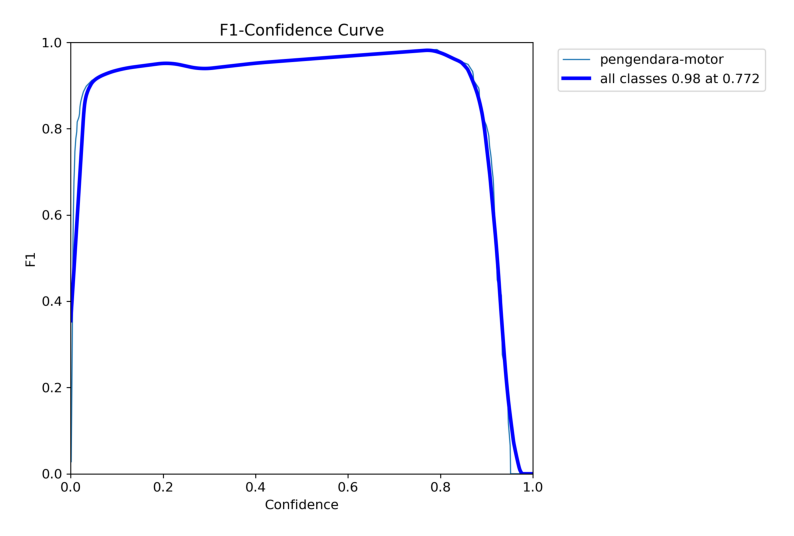

In [9]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg# Confusion Matrix
# Confusion Matrix
fig = plt.figure(figsize=(10, 9))
cm_img = mpimg.imread("/content/runs/detect/train/F1_curve.png")
plt.imshow(cm_img)
plt.axis("off")
fig.show()

In [10]:
# Validation Metrics

# Create Subplot
subplot_titles = ["Precision", "Recall", "mAP50", "mAP50-95"]
fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=subplot_titles,
)

# Configuration Plot
class PlotCFG:
    marker_size = 7
    line_size = 2
    train_color = "#1e3772"
    valid_color = "#2788f9"

metrics = ["precision", "recall", "mAP50", "mAP50-95"]
for i, metric in enumerate(metrics):
    # Plot
    fig.add_trace(
        go.Scatter(
            x=np.arange(1, training_results.shape[0]+1), y=training_results["metrics/{}(B)".format(metric)],
            mode="markers+lines",
            marker=dict(
                color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="White", width=0.5)
            ),
            line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
            name="Validation"
        ), row=(i//2)+1, col=(i%2)+1
    )

    # Update Axes
    fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=(i//2)+1, col=(i%2)+1)
    fig.update_yaxes(title=subplot_titles[i], linecolor="Black", ticks="outside", row=(i//2)+1, col=(i%2)+1)

# Update Layout
fig.update_layout(
    title="Validation Metrics", title_x=0.5, font_family="Trebuchet MS",
    width=950, height=600,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

<div>
    <h2 id = "yolov8-testing"
        style = "background-color: #9dd6fb;
                 border-radius: 15px;
                 color: #ffffff;
                 line-height: 20px;
                 padding: 11px;
                 font-size: 20px;
                 font-weight: bold;
                 font-family: Trebuchet MS;">YOLOv8 Testing
    </h2>
</div>

<div>
    <h3 style = "color: #2788f9; font-size: 18px; font-family: Trebuchet MS; font-weight: bold;">Model Testing</h3>
</div>

In [11]:
model = YOLO('/content/runs/detect/train/weights/best.pt')
metrics = model.val()
metrics.box.map

Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/ban-udah-bang-1/valid/labels.cache... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]


                   all         31         31      0.994      0.968      0.992      0.801
Speed: 0.6ms preprocess, 39.6ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/detect/val


0.8006414091883931

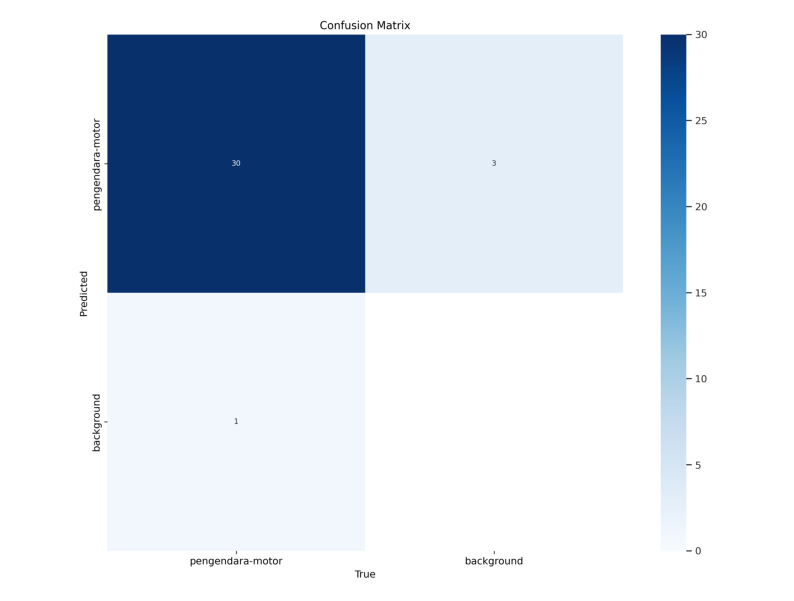

In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg# Confusion Matrix
# Confusion Matrix
fig = plt.figure(figsize=(10, 9))
cm_img = mpimg.imread("/content/runs/detect/val/confusion_matrix.png")
plt.imshow(cm_img)
plt.axis("off")
fig.show()

<div>
    <h2 id = "bbox-predictions"
        style = "background-color: #9dd6fb;
                 border-radius: 15px;
                 color: #ffffff;
                 line-height: 20px;
                 padding: 11px;
                 font-size: 20px;
                 font-weight: bold;
                 font-family: Trebuchet MS;">Create Dataframe
    </h2>
</div>

In [13]:
import shutil
import os

# Path folder sumber
path_sumber = "/content/ban-udah-bang-1/train/images"

# Path folder tujuan
path_tujuan = "/content/dataset"

# Mengecek apakah folder tujuan ada atau tidak, jika tidak ada, maka membuat folder baru
if not os.path.exists(path_tujuan):
    os.makedirs(path_tujuan)

# Meng-copy semua file dari folder sumber ke folder tujuan
for file_name in os.listdir(path_sumber):
    file_path_sumber = os.path.join(path_sumber, file_name)
    file_path_tujuan = os.path.join(path_tujuan, file_name)
    shutil.copy(file_path_sumber, file_path_tujuan)

print("Semua file telah di-copy ke folder tujuan.")


Semua file telah di-copy ke folder tujuan.


In [14]:
import shutil
import os

# Path folder sumber
path_sumber = "/content/ban-udah-bang-1/valid/images"

# Path folder tujuan
path_tujuan = "/content/dataset"

# Mengecek apakah folder tujuan ada atau tidak, jika tidak ada, maka membuat folder baru
if not os.path.exists(path_tujuan):
    os.makedirs(path_tujuan)

# Meng-copy semua file dari folder sumber ke folder tujuan
for file_name in os.listdir(path_sumber):
    file_path_sumber = os.path.join(path_sumber, file_name)
    file_path_tujuan = os.path.join(path_tujuan, file_name)
    shutil.copy(file_path_sumber, file_path_tujuan)

print("Semua file telah di-copy ke folder tujuan.")


Semua file telah di-copy ke folder tujuan.


In [15]:
import os
import pandas as pd

# Path folder gambar plat nomor
folder_path = '/content/dataset'

# List untuk menyimpan path gambar
image_paths = []

# Loop melalui gambar di folder dan dapatkan path gambar
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg'):
        image_path = os.path.join(folder_path, filename)
        image_paths.append(image_path)

# Buat DataFrame
data = {'image_path': image_paths}
data = pd.DataFrame(data)

# Tampilkan DataFrame
data

,image_path
0,/content/dataset/i29_screenshot-2023-11-30-161...
1,/content/dataset/i14_screenshot-2023-11-30-151...
2,/content/dataset/Cuplikan-layar-2023-12-02-142...
3,/content/dataset/i40_screenshot-2023-11-30-153...
4,/content/dataset/i36_screenshot-2023-11-30-153...
...,...
150,/content/dataset/Cuplikan-layar-2023-12-02-134...
151,/content/dataset/Cuplikan-layar-2023-12-02-150...
152,/content/dataset/i25_screenshot-2023-11-30-161...
153,/content/dataset/Cuplikan-layar-2023-12-02-200...


In [16]:
yolo_model = YOLO('/content/runs/detect/train/weights/best.pt')
results = yolo_model.predict(list(data["image_path"]),verbose=False)
all_box_list = []
all_conf_list = []
all_cls_list=[]

for result in results:
    boxes = result.boxes
    cls_list=[]
    box_list = []
    conf_list = []

    max_confidence = 0
    max_confidence_box = None
    # Store all boxes with confidence above a certain threshold
    for box in boxes:
      conf = round(float(box.conf), 2)
      cls=int(box.cls)
      if conf >= 0.25 and conf > max_confidence:
            max_confidence = conf
            max_confidence_box = box

    if max_confidence_box is not None:
      box_data = box.data[0][:4]
      box_data = [int(x) for x in box_data]
      cls_list.append(cls)
      conf_list.append(max_confidence)
      box_list.append(box_data)

    all_box_list.append(box_list)
    all_conf_list.append(conf_list)
    all_cls_list.append(cls_list)

data["pred_box"] = all_box_list
data["confidence"] = all_conf_list
data['cls']=all_cls_list
data['cls'] = data['cls'].apply(lambda x: x[0] if isinstance(x, list) and len(x) > 0 else x)
data

,image_path,pred_box,confidence,cls
0,/content/dataset/i29_screenshot-2023-11-30-161...,"[[83, 40, 553, 601]]",[0.88],0
1,/content/dataset/i14_screenshot-2023-11-30-151...,"[[57, 65, 510, 621]]",[0.82],0
2,/content/dataset/Cuplikan-layar-2023-12-02-142...,"[[20, 19, 579, 636]]",[0.92],0
3,/content/dataset/i40_screenshot-2023-11-30-153...,"[[154, 37, 528, 470]]",[0.92],0
4,/content/dataset/i36_screenshot-2023-11-30-153...,"[[9, 26, 586, 632]]",[0.93],0
...,...,...,...,...
150,/content/dataset/Cuplikan-layar-2023-12-02-134...,"[[14, 0, 638, 619]]",[0.93],0
151,/content/dataset/Cuplikan-layar-2023-12-02-150...,"[[22, 0, 601, 637]]",[0.93],0
152,/content/dataset/i25_screenshot-2023-11-30-161...,"[[55, 15, 635, 577]]",[0.91],0
153,/content/dataset/Cuplikan-layar-2023-12-02-200...,"[[1, 0, 448, 617]]",[0.9],0


In [17]:
import os
import cv2

def crop_images_without_label(data, save_folder):
    # Iterate through all indices
    for idx in range(len(data)):
        # Original Image
        ori_path = data["image_path"][idx]
        ori_image = cv2.imread(ori_path)

        # Annotate Box
        boxes = data["pred_box"][idx]
        for i, box in enumerate(boxes):
            # Get Plate Object
            x1, y1, x2, y2 = box
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            roi = ori_image[y1:y2, x1:x2]

            # Save the plate object image
            save_path = os.path.join(save_folder, f"pengendara_{idx}_{i}.jpg")
            cv2.imwrite(save_path, roi)

# Folder to save the cropped images
save_folder = '/content/pengendara'

# Create the save folder if it doesn't exist
os.makedirs(save_folder, exist_ok=True)

# Call the function to crop images without label
crop_images_without_label(data, save_folder)


/content/dataset/i14_screenshot-2023-11-30-151154_jpg.rf.420ab4406f838d54ca410bc4f061edad.jpg


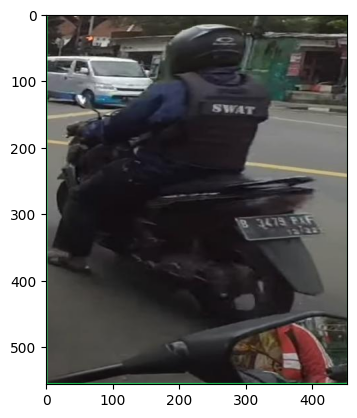

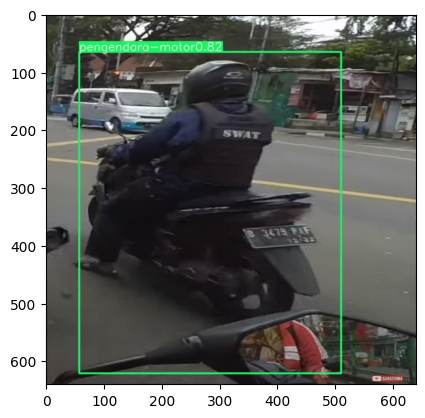

/content/dataset/Cuplikan-layar-2023-12-02-142512_png.rf.23274790ff5b951f3adcf561cea14726.jpg


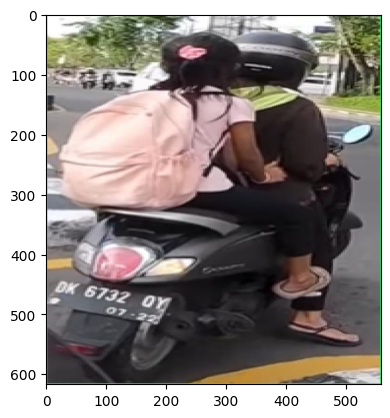

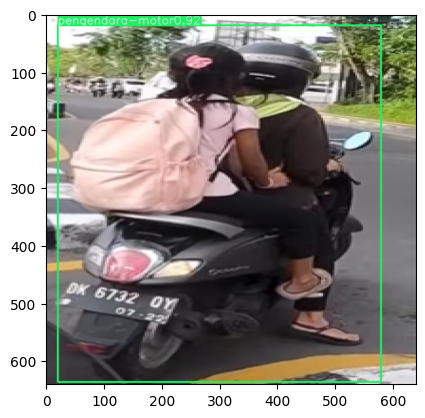

/content/dataset/i40_screenshot-2023-11-30-153607_jpg.rf.d59946d0999a9118f614f77da4b46675.jpg


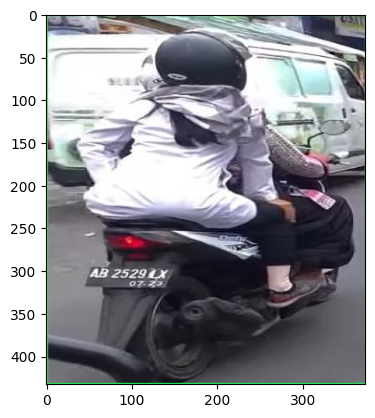

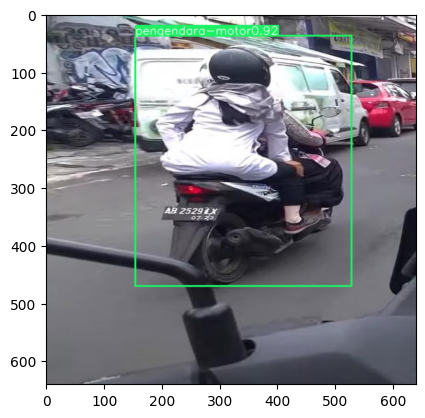

/content/dataset/i36_screenshot-2023-11-30-153432_jpg.rf.092e77070d139f1ffc67d9d6e18248a4.jpg


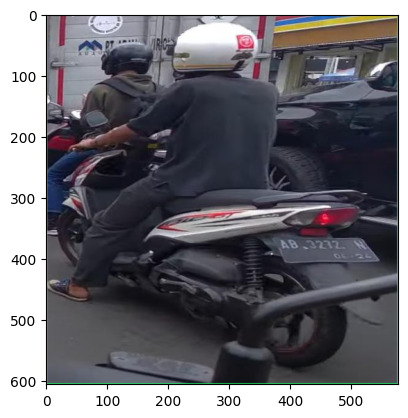

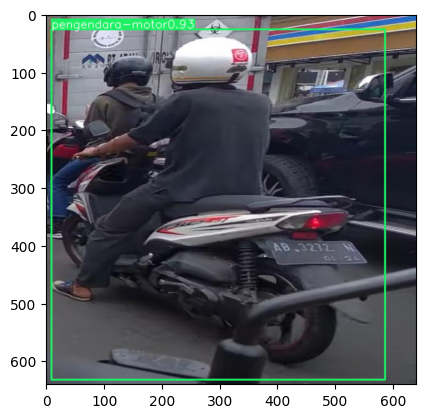

/content/dataset/Cuplikan-layar-2023-12-02-135619_png.rf.e45241f6bbf8c7497e2d9b1d83e656ef.jpg


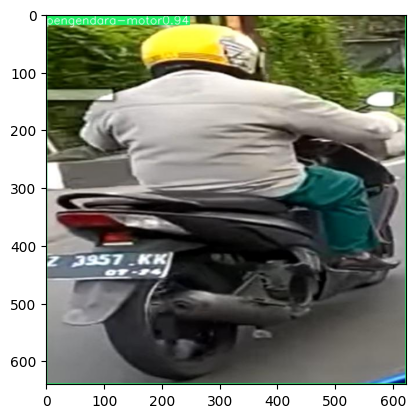

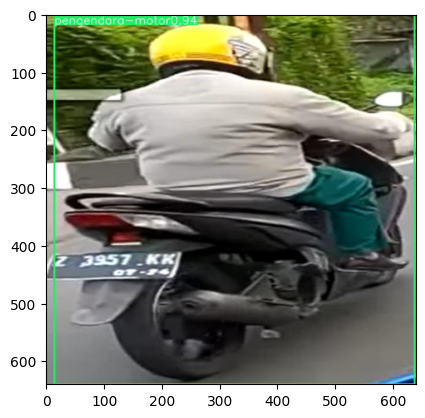

/content/dataset/Cuplikan-layar-2023-12-02-200259_png.rf.f558711cb82819f3c891d5ce4571a70d.jpg


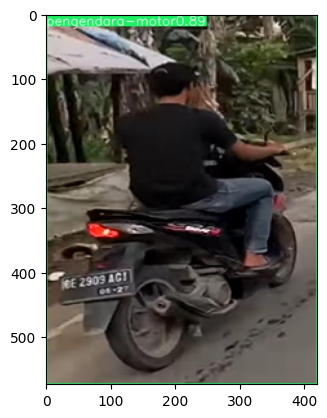

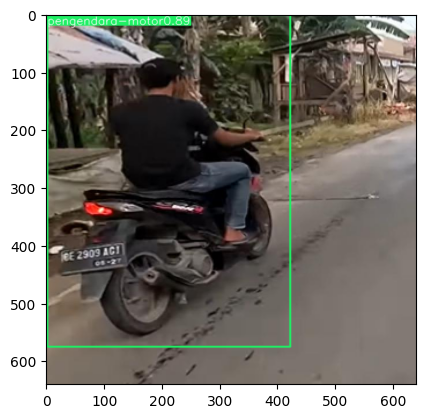

/content/dataset/i17_screenshot-2023-11-30-161119_jpg.rf.51c896bc4872f10c013b85ec547488c6.jpg


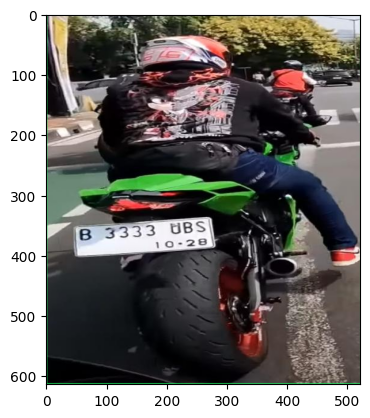

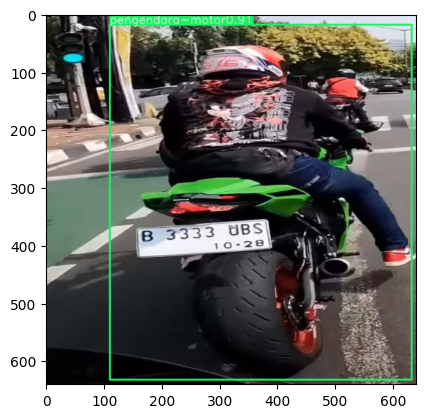

/content/dataset/Cuplikan-layar-2023-12-02-151043_png.rf.74a3bf73b3e5bb1383da62476f756065.jpg


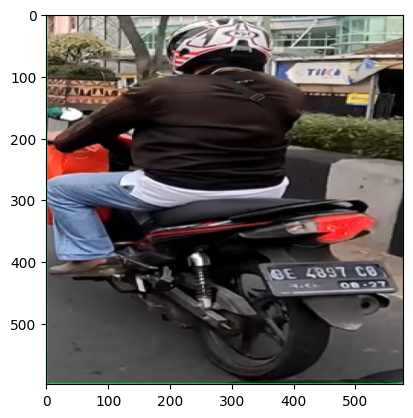

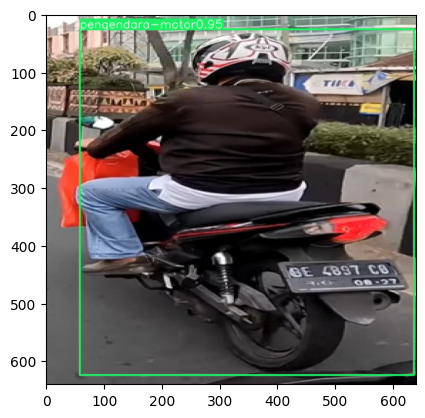

/content/dataset/i38_screenshot-2023-11-30-153513_jpg.rf.8d7cbedc7b2b0beead463e7ab7f478cc.jpg


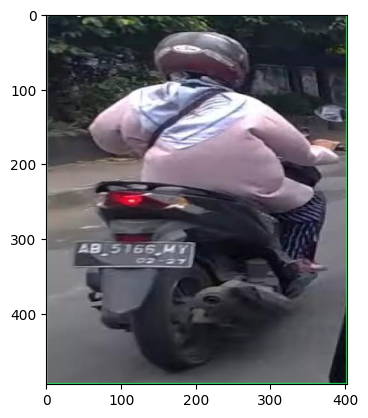

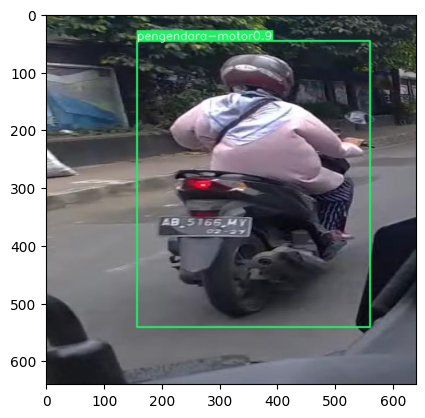

In [18]:
%matplotlib inline
from ultralytics.utils.plotting import Annotator
import cv2

def show_plate_detection(idx):
    # Original Image
    ori_path = data["image_path"][idx]
    print(ori_path)
    ori_image = cv2.imread(ori_path)
    ori_image = cv2.cvtColor(ori_image, cv2.COLOR_BGR2RGB)

    # Annotate Box
    annotator = Annotator(ori_image)
    boxes = data["pred_box"][idx]
    confs = data["confidence"][idx]
    for i, box in enumerate(boxes):
        annotator.box_label(box=box, label="pengendara-motor" + (str(confs[i])), color=(30, 240, 100))

        # Get Plate Object
        x1, y1, x2, y2 = box
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        roi = ori_image[y1:y2, x1:x2]
        plt.imshow(roi)
        plt.show()

    # Show Image
    frame = annotator.result()
    plt.imshow(frame)
    plt.show()

idxs = range(1,10)
for idx in idxs:
    show_plate_detection(idx)

In [19]:
import os
import pandas as pd

# Path folder gambar plat nomor
folder_path = '/content/pengendara'

# List untuk menyimpan path gambar
image_paths = []

# Loop melalui gambar di folder dan dapatkan path gambar
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg'):
        image_path = os.path.join(folder_path, filename)
        image_paths.append(image_path)

# Buat DataFrame
data = {'image_path': image_paths}
data = pd.DataFrame(data)

# Tampilkan DataFrame
data

,image_path
0,/content/pengendara/pengendara_119_0.jpg
1,/content/pengendara/pengendara_74_0.jpg
2,/content/pengendara/pengendara_14_0.jpg
3,/content/pengendara/pengendara_102_0.jpg
4,/content/pengendara/pengendara_40_0.jpg
...,...
149,/content/pengendara/pengendara_76_0.jpg
150,/content/pengendara/pengendara_85_0.jpg
151,/content/pengendara/pengendara_72_0.jpg
152,/content/pengendara/pengendara_44_0.jpg


Data Train Pengendara

In [20]:
from roboflow import Roboflow
rf = Roboflow(api_key="XR2ZyjOJoAJafsFuGlxQ")
project = rf.workspace("universitas-lampung").project("train_pengendara")
dataset = project.version(1).download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.225, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to train_pengendara-1 in yolov8:: 100%|██████████| 250/250 [00:00<00:00, 5833.01it/s]


Data Validation Pengendara

In [21]:
from roboflow import Roboflow
rf = Roboflow(api_key="XR2ZyjOJoAJafsFuGlxQ")
project = rf.workspace("universitas-lampung").project("validation_pengendara")
dataset = project.version(1).download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.225, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to validation_pengendara-1 in yolov8:: 100%|██████████| 68/68 [00:00<00:00, 6715.15it/s]


#Object Detection Untuk 4 Label

In [22]:
%%writefile /content/data.yaml
# Create Custom Dataset Configuration
train: '/content/train_pengendara-1/train/images'
val: '/content/validation_pengendara-1/valid/images'

nc: 4

names: [
  'exp-date',
  'helm',
  'licence-plate',
  'no-helm'

]

Overwriting /content/data.yaml


In [23]:
from ultralytics import YOLO

#model = YOLO()
model = YOLO("yolov8n.pt")
# the data.yaml file
model.train(data='/content/data.yaml', epochs=100)

Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript,

train: Scanning /content/train_pengendara-1/train/labels... 122 images, 0 backgrounds, 0 corrupt: 100%|██████████| 122/122 [00:00<00:00, 1897.88it/s]

train: New cache created: /content/train_pengendara-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/validation_pengendara-1/valid/labels... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [00:00<00:00, 773.40it/s]

val: New cache created: /content/validation_pengendara-1/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.73G      1.958      4.031      1.725         38        640: 100%|██████████| 8/8 [00:04<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

                   all         31        107    0.00391      0.369     0.0579     0.0241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       2.6G      1.768       3.43      1.533         61        640: 100%|██████████| 8/8 [00:01<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all         31        107    0.00702      0.632      0.252     0.0942



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       2.6G      1.839       2.56       1.47         35        640: 100%|██████████| 8/8 [00:02<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

                   all         31        107      0.917      0.106      0.185      0.067



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.62G      1.692      2.184       1.42         53        640: 100%|██████████| 8/8 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

                   all         31        107      0.942      0.144       0.23      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.62G       1.59      1.905      1.339         70        640: 100%|██████████| 8/8 [00:01<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all         31        107      0.709      0.205      0.374      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.62G       1.64      1.855      1.386         54        640: 100%|██████████| 8/8 [00:01<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all         31        107      0.811      0.182      0.374      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100       2.6G      1.545      1.756      1.303         44        640: 100%|██████████| 8/8 [00:01<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

                   all         31        107      0.729       0.21      0.473      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.59G      1.514      1.732      1.306         38        640: 100%|██████████| 8/8 [00:02<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

                   all         31        107      0.505      0.249      0.408      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.63G      1.544      1.607      1.286         55        640: 100%|██████████| 8/8 [00:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

                   all         31        107      0.579      0.283      0.475      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.63G      1.493      1.578      1.277         54        640: 100%|██████████| 8/8 [00:01<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

                   all         31        107      0.711      0.438      0.726      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.62G      1.475      1.518      1.283         58        640: 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all         31        107      0.717      0.463      0.696      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.62G      1.547      1.581      1.338         57        640: 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all         31        107      0.592      0.508      0.619      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.62G       1.48      1.588       1.32         44        640: 100%|██████████| 8/8 [00:01<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

                   all         31        107      0.685      0.562      0.674      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.62G      1.425      1.457       1.22         70        640: 100%|██████████| 8/8 [00:02<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

                   all         31        107      0.636      0.553      0.723      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.62G      1.427      1.385      1.253         55        640: 100%|██████████| 8/8 [00:02<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         31        107      0.562      0.513      0.602        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100       2.6G      1.395      1.363      1.257         46        640: 100%|██████████| 8/8 [00:01<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all         31        107      0.655      0.623      0.716      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100       2.6G      1.448      1.456      1.305         46        640: 100%|██████████| 8/8 [00:01<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         31        107      0.686      0.658      0.751      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.62G      1.373      1.377       1.23         43        640: 100%|██████████| 8/8 [00:01<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         31        107      0.602      0.695       0.76      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.62G       1.39      1.343      1.251         41        640: 100%|██████████| 8/8 [00:02<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

                   all         31        107      0.612      0.675      0.719      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       2.6G      1.359      1.327      1.213         44        640: 100%|██████████| 8/8 [00:02<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         31        107       0.71      0.697      0.771       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       2.6G      1.413      1.357      1.262         59        640: 100%|██████████| 8/8 [00:01<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         31        107      0.709      0.708      0.773       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.62G        1.4      1.285      1.235         41        640: 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

                   all         31        107      0.762       0.73      0.777      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100       2.6G       1.37      1.262      1.228         48        640: 100%|██████████| 8/8 [00:01<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all         31        107      0.793      0.767      0.842       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.63G      1.343      1.237      1.226         44        640: 100%|██████████| 8/8 [00:02<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

                   all         31        107      0.818      0.779      0.841      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       2.6G      1.297       1.22      1.188         59        640: 100%|██████████| 8/8 [00:02<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

                   all         31        107      0.876      0.707      0.814      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.63G      1.324       1.19      1.198         59        640: 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all         31        107      0.897      0.731      0.849      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.62G      1.334      1.165      1.208         42        640: 100%|██████████| 8/8 [00:01<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all         31        107      0.882      0.727      0.825       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.63G      1.316      1.191      1.195         53        640: 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all         31        107       0.86      0.676      0.802      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       2.6G      1.294      1.168      1.184         54        640: 100%|██████████| 8/8 [00:01<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

                   all         31        107      0.832      0.736      0.794      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.62G        1.3      1.147      1.184         64        640: 100%|██████████| 8/8 [00:02<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

                   all         31        107      0.884      0.721        0.8      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       2.6G      1.254      1.104      1.172         45        640: 100%|██████████| 8/8 [00:02<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

                   all         31        107      0.846      0.794      0.839      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.62G       1.26      1.099      1.207         54        640: 100%|██████████| 8/8 [00:01<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         31        107      0.864      0.849      0.876      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.62G      1.243      1.098      1.157         61        640: 100%|██████████| 8/8 [00:01<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

                   all         31        107      0.844      0.807      0.872       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.62G      1.312       1.12      1.211         56        640: 100%|██████████| 8/8 [00:01<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all         31        107      0.877      0.808      0.867      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.63G      1.213      1.081      1.121         44        640: 100%|██████████| 8/8 [00:01<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

                   all         31        107      0.903      0.798      0.862      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100       2.6G      1.226      1.063       1.15         48        640: 100%|██████████| 8/8 [00:02<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

                   all         31        107      0.876      0.813      0.869      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.62G      1.218      1.044      1.137         50        640: 100%|██████████| 8/8 [00:02<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         31        107      0.865      0.779      0.838      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       2.6G      1.201      1.043      1.121         67        640: 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         31        107      0.886      0.741      0.824      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.62G      1.185      1.036      1.139         54        640: 100%|██████████| 8/8 [00:01<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

                   all         31        107      0.935      0.729      0.848      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.63G      1.164      1.027      1.151         40        640: 100%|██████████| 8/8 [00:01<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

                   all         31        107      0.893      0.749      0.897      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.62G       1.19     0.9807      1.147         52        640: 100%|██████████| 8/8 [00:02<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

                   all         31        107      0.917       0.74      0.864      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100       2.6G      1.188      1.006       1.13         59        640: 100%|██████████| 8/8 [00:02<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         31        107      0.941       0.74      0.856      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.62G      1.174     0.9538      1.125         46        640: 100%|██████████| 8/8 [00:02<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all         31        107      0.925      0.781      0.851      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.62G      1.124     0.9955      1.097         42        640: 100%|██████████| 8/8 [00:01<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

                   all         31        107      0.914      0.792      0.881      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.63G       1.18     0.9555      1.118         48        640: 100%|██████████| 8/8 [00:01<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         31        107      0.939      0.863      0.934      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.62G      1.149     0.9742      1.111         42        640: 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         31        107      0.945      0.863      0.917      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.62G      1.216      1.021      1.146         63        640: 100%|██████████| 8/8 [00:02<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]

                   all         31        107      0.973      0.851      0.937      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.63G      1.135     0.9366      1.096         72        640: 100%|██████████| 8/8 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

                   all         31        107      0.884      0.825      0.911      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.63G      1.171      0.978       1.13         39        640: 100%|██████████| 8/8 [00:01<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

                   all         31        107      0.851      0.774      0.855      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.63G       1.15     0.9622      1.132         48        640: 100%|██████████| 8/8 [00:01<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

                   all         31        107      0.827      0.767      0.853      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.63G      1.094     0.9005      1.103         57        640: 100%|██████████| 8/8 [00:01<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         31        107      0.817      0.785      0.868      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100       2.6G      1.073      0.901      1.095         51        640: 100%|██████████| 8/8 [00:01<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all         31        107      0.925        0.8      0.888      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.62G      1.076     0.8979      1.083         40        640: 100%|██████████| 8/8 [00:02<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

                   all         31        107      0.963      0.798      0.901      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.62G      1.113     0.9133      1.093         57        640: 100%|██████████| 8/8 [00:02<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

                   all         31        107      0.937      0.835      0.901      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100       2.6G      1.086     0.8967      1.092         65        640: 100%|██████████| 8/8 [00:01<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

                   all         31        107      0.963        0.8      0.906      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100       2.6G       1.05      0.866      1.071         62        640: 100%|██████████| 8/8 [00:01<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]

                   all         31        107      0.914      0.809      0.894      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.62G      1.066     0.8831      1.089         46        640: 100%|██████████| 8/8 [00:01<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all         31        107      0.906        0.8      0.873        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.62G      1.041     0.8365      1.065         63        640: 100%|██████████| 8/8 [00:01<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         31        107       0.91      0.778      0.869      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.63G      1.037      0.821      1.062         61        640: 100%|██████████| 8/8 [00:02<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

                   all         31        107      0.933      0.784      0.875      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.63G      1.047     0.8405      1.067         35        640: 100%|██████████| 8/8 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

                   all         31        107      0.941      0.784      0.884       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.63G      1.041     0.8231       1.06         51        640: 100%|██████████| 8/8 [00:01<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all         31        107      0.893      0.778      0.888      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100       2.6G      1.026     0.7978      1.053         50        640: 100%|██████████| 8/8 [00:01<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         31        107      0.916      0.844      0.914       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.62G      1.028     0.8263      1.043         53        640: 100%|██████████| 8/8 [00:01<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all         31        107      0.915      0.881      0.929      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.63G     0.9973     0.8135      1.044         48        640: 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

                   all         31        107      0.964      0.897      0.932      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100       2.6G      1.007     0.8164      1.054         59        640: 100%|██████████| 8/8 [00:02<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

                   all         31        107      0.911      0.878      0.915        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100       2.6G      1.045     0.8159      1.068         56        640: 100%|██████████| 8/8 [00:02<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all         31        107       0.89      0.882      0.903      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100       2.6G     0.9731     0.7761      1.021         62        640: 100%|██████████| 8/8 [00:02<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         31        107      0.942      0.822      0.901      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100       2.6G     0.9806     0.7955      1.047         39        640: 100%|██████████| 8/8 [00:01<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all         31        107       0.95      0.771      0.869      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.62G     0.9784     0.7811      1.032         67        640: 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

                   all         31        107      0.941      0.764      0.846      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       2.6G       0.95     0.7865       1.03         45        640: 100%|██████████| 8/8 [00:01<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         31        107      0.868      0.749      0.852      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.62G     0.9565     0.7751      1.039         56        640: 100%|██████████| 8/8 [00:02<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         31        107      0.914      0.781      0.887       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100       2.6G     0.9521     0.7583      1.032         55        640: 100%|██████████| 8/8 [00:02<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

                   all         31        107      0.935      0.834      0.906      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.63G     0.9861     0.7634      1.022         51        640: 100%|██████████| 8/8 [00:01<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all         31        107      0.932      0.844      0.908      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100       2.6G     0.9552     0.7721      1.033         56        640: 100%|██████████| 8/8 [00:01<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

                   all         31        107      0.938      0.836      0.908      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.62G     0.9092     0.7329      1.012         55        640: 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all         31        107      0.931      0.859      0.921      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100       2.6G     0.9491     0.7512       1.05         57        640: 100%|██████████| 8/8 [00:02<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         31        107      0.944       0.87      0.936      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100       2.6G     0.9684     0.7599       1.03         78        640: 100%|██████████| 8/8 [00:02<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

                   all         31        107      0.937      0.883      0.941      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.62G     0.9133       0.74      1.021         40        640: 100%|██████████| 8/8 [00:02<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         31        107      0.933      0.903      0.933      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.62G     0.9027     0.7413      1.022         60        640: 100%|██████████| 8/8 [00:01<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         31        107      0.921      0.895      0.909      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.62G     0.9077     0.7094      1.016         44        640: 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all         31        107      0.893      0.887      0.903      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100       2.6G     0.8996      0.734      1.023         38        640: 100%|██████████| 8/8 [00:01<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         31        107      0.898      0.895      0.916      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       2.6G     0.8935     0.7172      1.017         60        640: 100%|██████████| 8/8 [00:02<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

                   all         31        107      0.926      0.876      0.931      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100       2.6G     0.8691     0.7032      1.005         41        640: 100%|██████████| 8/8 [00:02<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

                   all         31        107      0.945      0.871      0.944      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100       2.6G     0.8959     0.7215     0.9993         44        640: 100%|██████████| 8/8 [00:01<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

                   all         31        107       0.93      0.899      0.959       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100       2.6G     0.8736     0.7007          1         46        640: 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         31        107      0.946       0.89      0.957      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.62G     0.8559     0.7019      1.022         48        640: 100%|██████████| 8/8 [00:01<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         31        107      0.951      0.862      0.949      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.62G     0.8824     0.6975       1.01         53        640: 100%|██████████| 8/8 [00:01<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

                   all         31        107      0.892      0.918      0.946       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.63G     0.8868     0.6908      1.007         50        640: 100%|██████████| 8/8 [00:02<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

                   all         31        107      0.902      0.913      0.951      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.62G     0.8646     0.6752      1.014         46        640: 100%|██████████| 8/8 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

                   all         31        107      0.919      0.908       0.95      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.63G      0.814     0.6435     0.9715         60        640: 100%|██████████| 8/8 [00:01<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         31        107      0.938      0.897      0.949      0.565


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.72G     0.8323     0.7117      1.013         30        640: 100%|██████████| 8/8 [00:05<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

                   all         31        107      0.933      0.888      0.944      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.58G     0.8199     0.7151      1.038         34        640: 100%|██████████| 8/8 [00:02<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

                   all         31        107       0.87      0.905      0.923      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.58G     0.7992     0.6947     0.9939         34        640: 100%|██████████| 8/8 [00:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

                   all         31        107      0.857      0.893      0.918      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.58G     0.8293     0.7236      1.025         33        640: 100%|██████████| 8/8 [00:01<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

                   all         31        107       0.88      0.879      0.941      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.58G     0.8348     0.6911      1.053         30        640: 100%|██████████| 8/8 [00:01<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         31        107      0.918      0.896      0.948      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.58G     0.8206     0.6749      1.024         35        640: 100%|██████████| 8/8 [00:01<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         31        107      0.912      0.896      0.949      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.58G     0.7969     0.6635      1.021         32        640: 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         31        107      0.905      0.896      0.951      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.58G     0.8003     0.6761      1.033         31        640: 100%|██████████| 8/8 [00:02<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

                   all         31        107      0.901      0.896      0.951      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.58G     0.7913     0.6841      1.028         35        640: 100%|██████████| 8/8 [00:02<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

                   all         31        107      0.882      0.894      0.938      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.59G     0.8015     0.6939      1.028         29        640: 100%|██████████| 8/8 [00:01<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         31        107       0.88      0.893      0.939      0.534



100 epochs completed in 0.095 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


                   all         31        107      0.948      0.889      0.957      0.568
              exp-date         31         31          1      0.993      0.995      0.556
                  helm         31         33      0.875      0.939      0.948      0.515
         licence-plate         31         31      0.918          1      0.994      0.614
               no-helm         31         12          1      0.622      0.891      0.587
Speed: 0.2ms preprocess, 2.3ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d7f483a4250>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [24]:
model = YOLO('/content/runs/detect/train2/weights/best.pt')
metrics = model.val()
metrics.box.map

Ultralytics YOLOv8.0.225 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/validation_pengendara-1/valid/labels.cache... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.31it/s]


                   all         31        107      0.948      0.888      0.957      0.568
              exp-date         31         31          1      0.993      0.995      0.559
                  helm         31         33      0.876      0.939      0.948      0.511
         licence-plate         31         31      0.917          1      0.994      0.616
               no-helm         31         12          1      0.619      0.891      0.587
Speed: 0.4ms preprocess, 7.5ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs/detect/val2


0.568082374360414

In [25]:
import shutil
import os

# Path folder sumber
path_sumber = "/content/train_pengendara-1/train/images"

# Path folder tujuan
path_tujuan = "/content/data"

# Mengecek apakah folder tujuan ada atau tidak, jika tidak ada, maka membuat folder baru
if not os.path.exists(path_tujuan):
    os.makedirs(path_tujuan)

# Meng-copy semua file dari folder sumber ke folder tujuan
for file_name in os.listdir(path_sumber):
    file_path_sumber = os.path.join(path_sumber, file_name)
    file_path_tujuan = os.path.join(path_tujuan, file_name)
    shutil.copy(file_path_sumber, file_path_tujuan)

print("Semua file telah di-copy ke folder tujuan.")


Semua file telah di-copy ke folder tujuan.


In [26]:
import shutil
import os

# Path folder sumber
path_sumber = "/content/validation_pengendara-1/valid/images"

# Path folder tujuan
path_tujuan = "/content/data"

# Mengecek apakah folder tujuan ada atau tidak, jika tidak ada, maka membuat folder baru
if not os.path.exists(path_tujuan):
    os.makedirs(path_tujuan)

# Meng-copy semua file dari folder sumber ke folder tujuan
for file_name in os.listdir(path_sumber):
    file_path_sumber = os.path.join(path_sumber, file_name)
    file_path_tujuan = os.path.join(path_tujuan, file_name)
    shutil.copy(file_path_sumber, file_path_tujuan)

print("Semua file telah di-copy ke folder tujuan.")


Semua file telah di-copy ke folder tujuan.


In [27]:
import os
import pandas as pd

# Path folder gambar plat nomor
folder_path = '/content/data'

# List untuk menyimpan path gambar
image_paths = []

# Loop melalui gambar di folder dan dapatkan path gambar
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg'):
        image_path = os.path.join(folder_path, filename)
        image_paths.append(image_path)

# Buat DataFrame
data = {'image_path': image_paths}
data = pd.DataFrame(data)

# Tampilkan DataFrame
data

,image_path
0,/content/data/pengendara_128_0_jpg.rf.954d7958...
1,/content/data/pengendara_57_0_jpg.rf.0ba85e336...
2,/content/data/pengendara_116_0_jpg.rf.67c6db37...
3,/content/data/pengendara_45_0_jpg.rf.1b0cd95fa...
4,/content/data/pengendara_71_0_jpg.rf.801c4279a...
...,...
148,/content/data/pengendara_95_0_jpg.rf.7be1c1e7c...
149,/content/data/pengendara_86_0_jpg.rf.a7c9d2f1b...
150,/content/data/pengendara_142_0_jpg.rf.3a3f8fd7...
151,/content/data/pengendara_146_0_jpg.rf.52cbde27...


In [28]:
yolo_model = YOLO('/content/runs/detect/train2/weights/best.pt')
results = yolo_model.predict(list(data["image_path"]),verbose=False)
all_box_list = []
all_conf_list = []
all_cls_list=[]

for result in results:
    boxes = result.boxes
    cls_list=[]
    box_list = []
    conf_list = []

    # Store all boxes with confidence above a certain threshold
    for box in boxes:
      conf = round(float(box.conf), 2)
      cls=round(float(box.cls),2)
      if conf >= 0.5:
        box_data = box.data[0][:4]
        box_data = [int(x) for x in box_data]
        cls_list.append(cls)
        conf_list.append(conf)
        box_list.append(box_data)

    all_box_list.append(box_list)
    all_conf_list.append(conf_list)
    all_cls_list.append(cls_list)

data["pred_box"] = all_box_list
data["confidence"] = all_conf_list
data['cls']=all_cls_list

rows = []
for idx, row in data.iterrows():
    image_path = row['image_path']
    pred_boxes = row['pred_box']
    confidences = row['confidence']
    classes = row['cls']

    # Loop untuk setiap prediksi dalam satu baris
    for i in range(len(pred_boxes)):
        rows.append({
            "image_path": image_path,
            "pred_box": pred_boxes[i],
            "confidence": confidences[i],
            "cls": classes[i]
        })

# Buat dataframe baru dari list rows
new_df = pd.DataFrame(rows)
new_df

,image_path,pred_box,confidence,cls
0,/content/data/pengendara_128_0_jpg.rf.954d7958...,"[93, 26, 288, 133]",0.96,1.0
1,/content/data/pengendara_128_0_jpg.rf.954d7958...,"[145, 501, 224, 522]",0.89,0.0
2,/content/data/pengendara_128_0_jpg.rf.954d7958...,"[73, 470, 229, 503]",0.84,2.0
3,/content/data/pengendara_57_0_jpg.rf.0ba85e336...,"[220, 385, 338, 418]",0.93,0.0
4,/content/data/pengendara_57_0_jpg.rf.0ba85e336...,"[165, 27, 375, 110]",0.90,1.0
...,...,...,...,...
499,/content/data/pengendara_146_0_jpg.rf.52cbde27...,"[212, 435, 356, 461]",0.90,0.0
500,/content/data/pengendara_146_0_jpg.rf.52cbde27...,"[59, 406, 356, 441]",0.81,2.0
501,/content/data/pengendara_127_0_jpg.rf.861316fe...,"[213, 58, 435, 166]",0.96,1.0
502,/content/data/pengendara_127_0_jpg.rf.861316fe...,"[512, 447, 584, 463]",0.90,0.0


In [29]:
import cv2
import pandas as pd

# Fungsi untuk melakukan crop gambar
def crop_image(row):
    img = cv2.imread(row['image_path'])
    pred_box = row['pred_box']
    cropped_img = img[pred_box[1]:pred_box[3], pred_box[0]:pred_box[2]]
    return cropped_img

# Buat kolom baru 'cropped_image' dengan hasil crop gambar dalam bentuk array
new_df['cropped_image'] = new_df.apply(crop_image, axis=1)

# Tampilkan dataframe yang telah diperbarui
new_df

,image_path,pred_box,confidence,cls,cropped_image
0,/content/data/pengendara_128_0_jpg.rf.954d7958...,"[93, 26, 288, 133]",0.96,1.0,"[[[93, 103, 113], [78, 88, 98], [62, 72, 82], ..."
1,/content/data/pengendara_128_0_jpg.rf.954d7958...,"[145, 501, 224, 522]",0.89,0.0,"[[[57, 57, 57], [55, 55, 55], [54, 54, 54], [5..."
2,/content/data/pengendara_128_0_jpg.rf.954d7958...,"[73, 470, 229, 503]",0.84,2.0,"[[[132, 136, 147], [132, 136, 147], [132, 136,..."
3,/content/data/pengendara_57_0_jpg.rf.0ba85e336...,"[220, 385, 338, 418]",0.93,0.0,"[[[248, 242, 243], [250, 244, 245], [249, 243,..."
4,/content/data/pengendara_57_0_jpg.rf.0ba85e336...,"[165, 27, 375, 110]",0.90,1.0,"[[[100, 123, 115], [111, 134, 126], [118, 141,..."
...,...,...,...,...,...
499,/content/data/pengendara_146_0_jpg.rf.52cbde27...,"[212, 435, 356, 461]",0.90,0.0,"[[[122, 119, 121], [107, 104, 106], [94, 91, 9..."
500,/content/data/pengendara_146_0_jpg.rf.52cbde27...,"[59, 406, 356, 441]",0.81,2.0,"[[[130, 132, 133], [130, 132, 133], [130, 132,..."
501,/content/data/pengendara_127_0_jpg.rf.861316fe...,"[213, 58, 435, 166]",0.96,1.0,"[[[82, 76, 77], [82, 76, 77], [83, 77, 78], [7..."
502,/content/data/pengendara_127_0_jpg.rf.861316fe...,"[512, 447, 584, 463]",0.90,0.0,"[[[80, 60, 59], [84, 64, 63], [85, 65, 64], [8..."


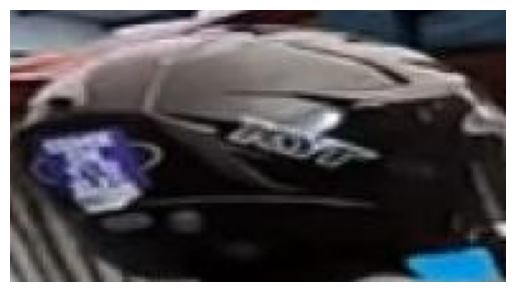

In [30]:
# Ambil gambar dari baris pertama
cropped_img = new_df['cropped_image'].iloc[0]

# Tampilkan gambar
plt.imshow(cropped_img)
plt.axis('off')
plt.show()

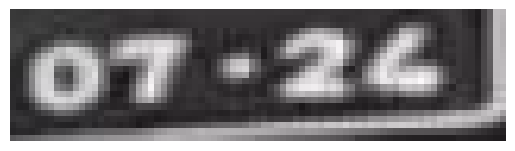

In [31]:
# Ambil gambar dari baris kedua
cropped_img = new_df['cropped_image'].iloc[1]

# Tampilkan gambar
plt.imshow(cropped_img)
plt.axis('off')
plt.show()

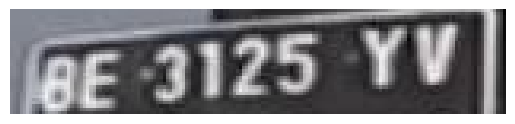

In [32]:
# Ambil gambar dari baris ketiga
cropped_img = new_df['cropped_image'].iloc[2]

# Tampilkan gambar
plt.imshow(cropped_img)
plt.axis('off')
plt.show()

Penerapan OCR

In [33]:
#filter kolom cls=[0.0,2.0]
filtered_df = new_df[new_df['cls'].isin([0.0, 2.0])]
filtered_df

,image_path,pred_box,confidence,cls,cropped_image
1,/content/data/pengendara_128_0_jpg.rf.954d7958...,"[145, 501, 224, 522]",0.89,0.0,"[[[57, 57, 57], [55, 55, 55], [54, 54, 54], [5..."
2,/content/data/pengendara_128_0_jpg.rf.954d7958...,"[73, 470, 229, 503]",0.84,2.0,"[[[132, 136, 147], [132, 136, 147], [132, 136,..."
3,/content/data/pengendara_57_0_jpg.rf.0ba85e336...,"[220, 385, 338, 418]",0.93,0.0,"[[[248, 242, 243], [250, 244, 245], [249, 243,..."
5,/content/data/pengendara_57_0_jpg.rf.0ba85e336...,"[57, 353, 336, 394]",0.78,2.0,"[[[114, 119, 118], [114, 119, 118], [114, 119,..."
7,/content/data/pengendara_116_0_jpg.rf.67c6db37...,"[132, 393, 220, 410]",0.91,0.0,"[[[97, 79, 80], [96, 78, 79], [93, 75, 76], [9..."
...,...,...,...,...,...
497,/content/data/pengendara_142_0_jpg.rf.3a3f8fd7...,"[85, 433, 272, 460]",0.81,2.0,"[[[171, 180, 194], [170, 179, 192], [169, 178,..."
499,/content/data/pengendara_146_0_jpg.rf.52cbde27...,"[212, 435, 356, 461]",0.90,0.0,"[[[122, 119, 121], [107, 104, 106], [94, 91, 9..."
500,/content/data/pengendara_146_0_jpg.rf.52cbde27...,"[59, 406, 356, 441]",0.81,2.0,"[[[130, 132, 133], [130, 132, 133], [130, 132,..."
502,/content/data/pengendara_127_0_jpg.rf.861316fe...,"[512, 447, 584, 463]",0.90,0.0,"[[[80, 60, 59], [84, 64, 63], [85, 65, 64], [8..."


In [34]:
import cv2
import os

# Fungsi untuk preprocessing dan resize gambar
def preprocess_and_resize(image):
    # Resize gambar ke 200x200
    resized_image = cv2.resize(image, (384,384))

    return resized_image

# Path folder gambar plat nomor
input_folder_path = '/content/drive/MyDrive/TrOCR'
output_folder_path = '/content/drive/MyDrive/preprocessing_OCR'

# Buat folder output jika belum ada
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)

# Loop melalui gambar di folder dan lakukan preprocessing dan resize
for filename in os.listdir(input_folder_path):
    if filename.endswith('.png'):
        image_path = os.path.join(input_folder_path, filename)
        image = cv2.imread(image_path)

        # Panggil fungsi preprocessing dan resize
        preprocessed_resized_image = preprocess_and_resize(image)

        # Simpan gambar hasil preprocessing dan resize
        output_path = os.path.join(output_folder_path, filename)
        cv2.imwrite(output_path, preprocessed_resized_image)


In [1]:
import os
import pandas as pd

# Path folder gambar plat nomor
folder_path = '/content/drive/MyDrive/preprocessing_OCR'

# List untuk menyimpan path gambar
image_paths = []

# Loop melalui gambar di folder dan dapatkan path gambar
for filename in os.listdir(folder_path):
    if filename.endswith('.png'):
        image_path = os.path.join(folder_path, filename)
        image_paths.append(image_path)

# Buat DataFrame
data = {'image_path': image_paths}
data = pd.DataFrame(data)

# Tampilkan DataFrame
data

,image_path
0,/content/drive/MyDrive/preprocessing_OCR/B3479...
1,/content/drive/MyDrive/preprocessing_OCR/0827 ...
2,/content/drive/MyDrive/preprocessing_OCR/AD492...
3,/content/drive/MyDrive/preprocessing_OCR/BE326...
4,/content/drive/MyDrive/preprocessing_OCR/0621.png
...,...
272,/content/drive/MyDrive/preprocessing_OCR/1227.png
273,/content/drive/MyDrive/preprocessing_OCR/DK593...
274,/content/drive/MyDrive/preprocessing_OCR/0827.png
275,/content/drive/MyDrive/preprocessing_OCR/0324.png


In [2]:
# Fungsi untuk mendapatkan target dari nama file
def get_target_from_filename(filename):
    # Mengambil nama file tanpa ekstensi
    name = os.path.splitext(filename)[0]

    # Menghapus tanda kurung jika ada
    if '(' in name and ')' in name:
        # Mencari indeks dari kurung buka dan tutup
        start_idx = name.index('(')
        end_idx = name.index(')')

        # Mengambil bagian nama sebelum tanda kurung
        name = name[:start_idx]

    # Menghapus spasi dalam nama file
    name = name.replace(" ", "")

    return name

# Menambahkan kolom 'target' ke dalam DataFrame
data['target'] = data['image_path'].apply(lambda x: get_target_from_filename(os.path.basename(x)))

# Tampilkan DataFrame dengan kolom 'target' baru
(data)


,image_path,target
0,/content/drive/MyDrive/preprocessing_OCR/B3479...,B3479PXF
1,/content/drive/MyDrive/preprocessing_OCR/0827 ...,0827
2,/content/drive/MyDrive/preprocessing_OCR/AD492...,AD4929IL
3,/content/drive/MyDrive/preprocessing_OCR/BE326...,BE3261UR
4,/content/drive/MyDrive/preprocessing_OCR/0621.png,0621
...,...,...
272,/content/drive/MyDrive/preprocessing_OCR/1227.png,1227
273,/content/drive/MyDrive/preprocessing_OCR/DK593...,DK5935ACO
274,/content/drive/MyDrive/preprocessing_OCR/0827.png,0827
275,/content/drive/MyDrive/preprocessing_OCR/0324.png,0324


In [4]:
data.dtypes

image_path    object
target        object
dtype: object

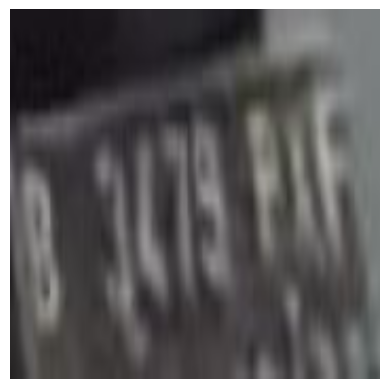

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Path to the image in the first row
image_path_first_row = data.loc[0, 'image_path']

# Load and display the image
img = mpimg.imread(image_path_first_row)

# Display the image
plt.imshow(img)
plt.axis('off')  # Hide axes for images
plt.show()


In [6]:
import cv2
# Function for data augmentation with grayscale preprocessing
def data_augmentation_with_grayscale(df):
    new_df = pd.DataFrame(columns=df.columns)

    # Create the "augmented" folder if it doesn't exist
    augmented_folder = '/content/drive/MyDrive/augmented'
    if not os.path.exists(augmented_folder):
        os.makedirs(augmented_folder)

    for i in range(len(data)):
        img_path = data.iloc[i]['image_path']
        label = data.iloc[i]['target']

        # Read the original image
        original_img = cv2.imread(img_path)

        # Preprocess the original image to grayscale
        gray_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)

        # Save the grayscale image
        new_image_name = os.path.basename(img_path).split('.')[0] + '_grayscale.png'
        new_img_path = os.path.join(augmented_folder, new_image_name)
        cv2.imwrite(new_img_path, gray_img)

        # Create DataFrame rows for original and grayscale images
        new_df = pd.concat([
            new_df,
            pd.DataFrame({'image_path': [img_path, new_img_path], 'target': [label, label]})
        ], ignore_index=True)

    return new_df

# Call the data_augmentation_with_grayscale function
data_with_grayscale = data_augmentation_with_grayscale(data)

# Display the augmented data with grayscale images
data_with_grayscale


,image_path,target
0,/content/drive/MyDrive/preprocessing_OCR/B3479...,B3479PXF
1,/content/drive/MyDrive/augmented/B3479PXF_gray...,B3479PXF
2,/content/drive/MyDrive/preprocessing_OCR/0827 ...,0827
3,/content/drive/MyDrive/augmented/0827 (3)_gray...,0827
4,/content/drive/MyDrive/preprocessing_OCR/AD492...,AD4929IL
...,...,...
549,/content/drive/MyDrive/augmented/0827_grayscal...,0827
550,/content/drive/MyDrive/preprocessing_OCR/0324.png,0324
551,/content/drive/MyDrive/augmented/0324_grayscal...,0324
552,/content/drive/MyDrive/preprocessing_OCR/1028.png,1028


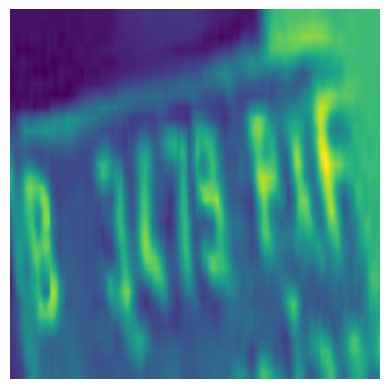

In [7]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Path to the image in the first row
image_path_first_row = data_with_grayscale.loc[1, 'image_path']

# Load and display the image
img = mpimg.imread(image_path_first_row)

# Display the image
plt.imshow(img)
plt.axis('off')  # Hide axes for images
plt.show()


In [8]:
from sklearn.model_selection import train_test_split

# # create test data from training data, take 25 rows and remove it from training data ( For testing the accuracy )
# test_df = training_data.sample(20, random_state=42)
# training_data = training_data.drop(test_df.index)

train_df, valid_df = train_test_split(data_with_grayscale, test_size=0.2, random_state=42)

train_df.reset_index(drop=True, inplace=True)
valid_df.reset_index(drop=True, inplace=True)
# test_df.reset_index(drop=True, inplace=True)

print('train_df shape : ', train_df.shape)
print('valid_df shape : ', valid_df.shape)

train_df

train_df shape :  (443, 2)
valid_df shape :  (111, 2)


,image_path,target
0,/content/drive/MyDrive/augmented/B6000BMG_gray...,B6000BMG
1,/content/drive/MyDrive/augmented/B6905FWA_gray...,B6905FWA
2,/content/drive/MyDrive/preprocessing_OCR/0526 ...,0526
3,/content/drive/MyDrive/augmented/1223_grayscal...,1223
4,/content/drive/MyDrive/augmented/0522_grayscal...,0522
...,...,...
438,/content/drive/MyDrive/augmented/0524 (6)_gray...,0524
439,/content/drive/MyDrive/preprocessing_OCR/Z3758...,Z3758IN
440,/content/drive/MyDrive/preprocessing_OCR/B6727...,B6727RUN
441,/content/drive/MyDrive/augmented/B4679BJS_gray...,B4679BJS


In [9]:
valid_df

,image_path,target
0,/content/drive/MyDrive/augmented/1023_grayscal...,1023
1,/content/drive/MyDrive/augmented/H7092XD_grays...,H7092XD
2,/content/drive/MyDrive/augmented/0525 (2)_gray...,0525
3,/content/drive/MyDrive/augmented/Z4934NZ (2)_g...,Z4934NZ
4,/content/drive/MyDrive/augmented/0225 (3)_gray...,0225
...,...,...
106,/content/drive/MyDrive/augmented/R2905XJ_grays...,R2905XJ
107,/content/drive/MyDrive/augmented/DK5935ACO_gra...,DK5935ACO
108,/content/drive/MyDrive/augmented/0525 (4)_gray...,0525
109,/content/drive/MyDrive/augmented/0524 (3)_gray...,0524


In [10]:
##import locale
##print(locale.getpreferredencoding())

In [1]:
!pip install transformers
!pip install -q datasets jiwer --quiet
!pip install --upgrade accelerate --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 2.2 MB/s eta 0:00:00


In [11]:
from transformers import TrOCRProcessor, VisionEncoderDecoderModel

# If you want to start from the pretrained model, load the checkpoint with `VisionEncoderDecoderModel`
processor = TrOCRProcessor.from_pretrained('microsoft/trocr-base-stage1')

# TrOCR is a decoder model and should be used within a VisionEncoderDecoderModel
model = VisionEncoderDecoderModel.from_pretrained('microsoft/trocr-base-stage1')

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.
Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-base-stage1 and are newly initialized: ['encoder.pooler.dense.weight', 'encoder.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [12]:
model

VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=False)
              (key): Linear(in_features=768, out_features=768, bias=False)
              (value): Linear(in_features=768, out_features=768, bias=False)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_fea

In [13]:
import torch
from torch.utils.data import Dataset
from PIL import Image

class LPDataset(Dataset):
    def __init__(self, root_dir, df, processor, max_target_length=128):
        self.root_dir = root_dir
        self.df = df  # Use the provided DataFrame
        self.processor = processor
        self.max_target_length = max_target_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # get file name and text
        file_path = self.df.iloc[idx]['image_path']
        text = self.df.iloc[idx]['target']  # Assuming 'Target' is the correct column for text

        # prepare image (i.e., resize + normalize)
        image = Image.open(self.root_dir + file_path).convert("RGB")
        pixel_values = self.processor(image, return_tensors="pt").pixel_values

        # add labels (input_ids) by encoding the text
        labels = self.processor.tokenizer(
            text, padding="max_length", max_length=self.max_target_length, truncation=True)['input_ids']

        # Replace 'Target' with -100 for PAD tokens
        labels = [-100 if label == self.processor.tokenizer.pad_token_id else label for label in labels]

        encoding = {"pixel_values": pixel_values.squeeze(), "labels": torch.tensor(labels)}
        return encoding

    def __iter__(self):
        for i in range(self.__len__()):
            yield self.__getitem__(i)

In [14]:
processor

TrOCRProcessor:
- image_processor: ViTImageProcessor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 384,
    "width": 384
  }
}

- tokenizer: RobertaTokenizerFast(name_or_path='microsoft/trocr-base-stage1', vocab_size=50265, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedTo

In [15]:
root_dir = ''

train_dataset = LPDataset(root_dir, train_df, processor)
eval_dataset = LPDataset(root_dir, valid_df, processor)

In [16]:
# set special tokens used for creating the decoder_input_ids from the labels
model.config.decoder_start_token_id = processor.tokenizer.cls_token_id
model.config.pad_token_id = processor.tokenizer.pad_token_id
# make sure vocab size is set correctly
model.config.vocab_size = model.config.decoder.vocab_size

# set beam search parameters
model.config.eos_token_id = processor.tokenizer.sep_token_id
model.config.max_length = 9
model.config.early_stopping = True
model.config.no_repeat_ngram_size = 3
model.config.length_penalty = 2.0
model.config.num_beams = 4

In [17]:
import torch
print(model.config.decoder.decoder_start_token_id)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

2


VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=False)
              (key): Linear(in_features=768, out_features=768, bias=False)
              (value): Linear(in_features=768, out_features=768, bias=False)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_fea

In [18]:
from datasets import load_metric

cer_metric = load_metric("cer")

<ipython-input-18-c81d87c6f9c2>:3: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  cer_metric = load_metric("cer")


In [19]:
def compute_metrics(pred):
    labels_ids = pred.label_ids
    pred_ids = pred.predictions

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    labels_ids[labels_ids == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels_ids, skip_special_tokens=True)

    cer = cer_metric.compute(predictions=pred_str, references=label_str)

    return {"cer": cer}

In [20]:
import os
output_dir = 'out'
os.makedirs(output_dir, exist_ok=True)

In [21]:
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments, default_data_collator
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    evaluation_strategy="steps",
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    fp16=True,
    overwrite_output_dir=True,
    output_dir=output_dir,
    logging_steps=2,
    save_steps=1000,
    eval_steps=50,
    report_to=['tensorboard'],
    run_name='trocr-base-printed',
    metric_for_best_model="cer",
    seed=42,
    num_train_epochs=10,
    dataloader_num_workers=4,
    greater_is_better=False,
)


# initiate trainer
trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=processor.feature_extractor,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    data_collator=default_data_collator,
)

/usr/local/lib/python3.10/dist-packages/transformers/models/trocr/processing_trocr.py:135: FutureWarning: `feature_extractor` is deprecated and will be removed in v5. Use `image_processor` instead.
  warnings.warn(


In [22]:
trainer.train()

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Step,Training Loss,Validation Loss,Cer
50,1.113700,1.243155,0.410377
100,0.929200,0.773098,0.103774
150,0.543200,0.676344,0.077044
200,0.398700,0.715021,0.097484
250,0.470100,0.643632,0.059748
300,0.456600,0.517568,0.037736
350,0.532900,0.523258,0.053459
400,0.377500,0.546794,0.040881
450,0.295200,0.484712,0.025157
500,0.293000,0.463880,0.023585


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1473: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed soon, in a future version. Please use and modify the model generation configuration (see https://huggingface.co/docs/transformers/generation_strategies#default-text-generation-configuration )
  warnings.warn(


TrainOutput(global_step=560, training_loss=0.6273330609713282, metrics={'train_runtime': 723.9318, 'train_samples_per_second': 6.119, 'train_steps_per_second': 0.774, 'total_flos': 3.9200868464276275e+18, 'train_loss': 0.6273330609713282, 'epoch': 10.0})

In [23]:
trainer.save_model("/content/drive/MyDrive/train")

In [24]:
processor.save_pretrained('/content/drive/MyDrive/processor')

In [25]:
import time
save_time = time.time()
model.save_pretrained("/content/TROCR Base Stage1")
save_time = time.time() - save_time
print('save_time time (sec)', save_time)

save_time time (sec) 7.34531307220459


In [26]:
evaluation = trainer.evaluate()

print(evaluation)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


{'eval_loss': 0.4494248032569885, 'eval_cer': 0.02358490566037736, 'eval_runtime': 21.7968, 'eval_samples_per_second': 5.092, 'eval_steps_per_second': 0.642, 'epoch': 10.0}


In [27]:
trainer.log_metrics("eval", evaluation)

***** eval metrics *****
  epoch                   =       10.0
  eval_cer                =     0.0236
  eval_loss               =     0.4494
  eval_runtime            = 0:00:21.79
  eval_samples_per_second =      5.092
  eval_steps_per_second   =      0.642


In [28]:
# making pred on testing dataframe
pred = []

for imges_path in valid_df['image_path']:
    image = Image.open(imges_path).convert("RGB")
    pixel_values = processor(image, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    pred.append(generated_text)

valid_df['Prediksi'] = pred

# change the 'img' column to 'Name of File'
valid_df.rename(columns={'img': 'Name of File'}, inplace=True)

valid_df

,image_path,target,Prediksi
0,/content/drive/MyDrive/augmented/1023_grayscal...,1023,1021
1,/content/drive/MyDrive/augmented/H7092XD_grays...,H7092XD,H7092XD
2,/content/drive/MyDrive/augmented/0525 (2)_gray...,0525,0525
3,/content/drive/MyDrive/augmented/Z4934NZ (2)_g...,Z4934NZ,Z4934NZ
4,/content/drive/MyDrive/augmented/0225 (3)_gray...,0225,0225
...,...,...,...
106,/content/drive/MyDrive/augmented/R2905XJ_grays...,R2905XJ,R2905XJ
107,/content/drive/MyDrive/augmented/DK5935ACO_gra...,DK5935ACO,DK5935ACO
108,/content/drive/MyDrive/augmented/0525 (4)_gray...,0525,0525
109,/content/drive/MyDrive/augmented/0524 (3)_gray...,0524,0524


In [29]:
import pandas as pd

def accuracy_per_character(label, prediction):
    correct = sum(l == p for l, p in zip(label, prediction))
    return correct / len(label)

valid_df['accuracy'] = valid_df.apply(lambda row: accuracy_per_character(row['target'], row['Prediksi']), axis=1)

valid_df

,image_path,target,Prediksi,accuracy
0,/content/drive/MyDrive/augmented/1023_grayscal...,1023,1021,0.75
1,/content/drive/MyDrive/augmented/H7092XD_grays...,H7092XD,H7092XD,1.00
2,/content/drive/MyDrive/augmented/0525 (2)_gray...,0525,0525,1.00
3,/content/drive/MyDrive/augmented/Z4934NZ (2)_g...,Z4934NZ,Z4934NZ,1.00
4,/content/drive/MyDrive/augmented/0225 (3)_gray...,0225,0225,1.00
...,...,...,...,...
106,/content/drive/MyDrive/augmented/R2905XJ_grays...,R2905XJ,R2905XJ,1.00
107,/content/drive/MyDrive/augmented/DK5935ACO_gra...,DK5935ACO,DK5935ACO,1.00
108,/content/drive/MyDrive/augmented/0525 (4)_gray...,0525,0525,1.00
109,/content/drive/MyDrive/augmented/0524 (3)_gray...,0524,0524,1.00


In [30]:
valid_df = valid_df.sort_values(by='accuracy', ascending=False)
valid_df

,image_path,target,Prediksi,accuracy
55,/content/drive/MyDrive/preprocessing_OCR/Z3550...,Z3550RK,Z3550RK,1.000
82,/content/drive/MyDrive/augmented/1123_grayscal...,1123,1123,1.000
80,/content/drive/MyDrive/augmented/0324 (2)_gray...,0324,0324,1.000
79,/content/drive/MyDrive/preprocessing_OCR/1225.png,1225,1225,1.000
78,/content/drive/MyDrive/augmented/BE2412ABW_gra...,BE2412ABW,BE2412ABW,1.000
...,...,...,...,...
58,/content/drive/MyDrive/augmented/B4861KOF_gray...,B4861KOF,B4861KBF,0.875
73,/content/drive/MyDrive/preprocessing_OCR/1023.png,1023,1021,0.750
0,/content/drive/MyDrive/augmented/1023_grayscal...,1023,1021,0.750
92,/content/drive/MyDrive/augmented/Z3861KG_grays...,Z3861KG,1251TQ,0.000


In [31]:
valid_df['accuracy'].mean()

0.9752252252252253

Testing Data

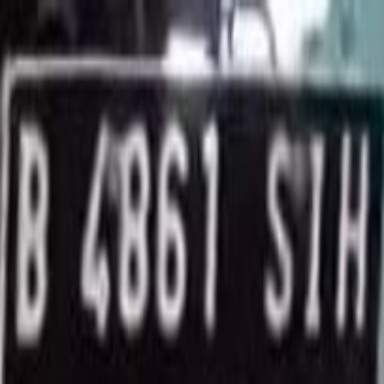

In [39]:
from PIL import Image
image = Image.open('/content/drive/MyDrive/preprocessing_OCR/B4861SIH (3).png').convert("RGB")
image

In [40]:
pixel_values = processor(images=image, return_tensors="pt").pixel_values
pixel_values

tensor([[[[-0.9059, -0.9059, -0.8980,  ..., -0.0667, -0.0667, -0.0667],
          [-0.9059, -0.9059, -0.8980,  ..., -0.0667, -0.0667, -0.0667],
          [-0.9059, -0.9059, -0.8980,  ..., -0.0667, -0.0667, -0.0667],
          ...,
          [ 0.3647,  0.1529, -0.2314,  ...,  0.1373,  0.1137,  0.1059],
          [ 0.3647,  0.1529, -0.2314,  ...,  0.1373,  0.1137,  0.1059],
          [ 0.3647,  0.1529, -0.2314,  ...,  0.1373,  0.1137,  0.1059]],

         [[-0.9451, -0.9451, -0.9373,  ...,  0.2078,  0.2078,  0.2078],
          [-0.9451, -0.9451, -0.9373,  ...,  0.2078,  0.2078,  0.2078],
          [-0.9451, -0.9451, -0.9373,  ...,  0.2078,  0.2078,  0.2078],
          ...,
          [ 0.3098,  0.0980, -0.2863,  ...,  0.1608,  0.1373,  0.1294],
          [ 0.3098,  0.0980, -0.2784,  ...,  0.1608,  0.1373,  0.1294],
          [ 0.3098,  0.0980, -0.2784,  ...,  0.1608,  0.1373,  0.1294]],

         [[-0.9294, -0.9294, -0.9216,  ...,  0.2392,  0.2392,  0.2392],
          [-0.9294, -0.9294, -

In [41]:
pixel_values = pixel_values.to(device)
pixel_values

tensor([[[[-0.9059, -0.9059, -0.8980,  ..., -0.0667, -0.0667, -0.0667],
          [-0.9059, -0.9059, -0.8980,  ..., -0.0667, -0.0667, -0.0667],
          [-0.9059, -0.9059, -0.8980,  ..., -0.0667, -0.0667, -0.0667],
          ...,
          [ 0.3647,  0.1529, -0.2314,  ...,  0.1373,  0.1137,  0.1059],
          [ 0.3647,  0.1529, -0.2314,  ...,  0.1373,  0.1137,  0.1059],
          [ 0.3647,  0.1529, -0.2314,  ...,  0.1373,  0.1137,  0.1059]],

         [[-0.9451, -0.9451, -0.9373,  ...,  0.2078,  0.2078,  0.2078],
          [-0.9451, -0.9451, -0.9373,  ...,  0.2078,  0.2078,  0.2078],
          [-0.9451, -0.9451, -0.9373,  ...,  0.2078,  0.2078,  0.2078],
          ...,
          [ 0.3098,  0.0980, -0.2863,  ...,  0.1608,  0.1373,  0.1294],
          [ 0.3098,  0.0980, -0.2784,  ...,  0.1608,  0.1373,  0.1294],
          [ 0.3098,  0.0980, -0.2784,  ...,  0.1608,  0.1373,  0.1294]],

         [[-0.9294, -0.9294, -0.9216,  ...,  0.2392,  0.2392,  0.2392],
          [-0.9294, -0.9294, -

In [42]:
generated_ids = model.generate(pixel_values)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

In [43]:
generated_ids

tensor([[   0,  387, 3818, 5606, 6850,  725,    2]], device='cuda:0')

In [44]:
generated_text

'B4861SIH'

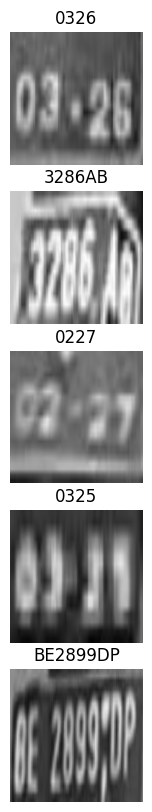

In [38]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

folder_of_test = '/content/drive/MyDrive/augmented'

# Mendapatkan daftar file dari folder_of_test
file_list = os.listdir(folder_of_test)

# Memilih secara acak 5 file dari daftar tersebut
random_files = np.random.choice(file_list, 5, replace=False)

fig, ax = plt.subplots(5, 1, figsize=(20, 10))

for i, pic in enumerate(random_files):
    image = Image.open(os.path.join(folder_of_test, pic)).convert("RGB")
    pixel_values = processor(image, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(device)
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    ax[i].imshow(image)
    ax[i].set_title(generated_text)
    ax[i].axis("off")

plt.show()


# Test menggunakan model yang sudah disimpan

In [7]:
from transformers import TrOCRProcessor, VisionEncoderDecoderModel

# If you want to start from the pretrained model, load the checkpoint with `VisionEncoderDecoderModel`
processor = TrOCRProcessor.from_pretrained('/content/drive/MyDrive/processor')

# TrOCR is a decoder model and should be used within a VisionEncoderDecoderModel
model = VisionEncoderDecoderModel.from_pretrained('/content/TROCR Base Stage1')

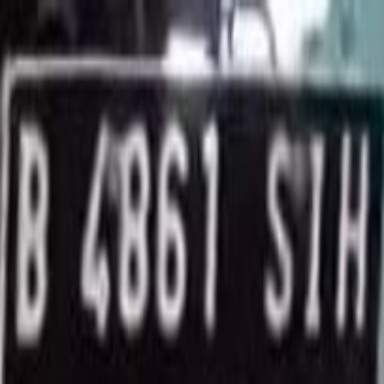

In [8]:
from PIL import Image
image = Image.open('/content/drive/MyDrive/preprocessing_OCR/B4861SIH (3).png').convert("RGB")
image

In [9]:
pixel_values = processor(images=image, return_tensors="pt").pixel_values
pixel_values

tensor([[[[-0.9059, -0.9059, -0.8980,  ..., -0.0667, -0.0667, -0.0667],
          [-0.9059, -0.9059, -0.8980,  ..., -0.0667, -0.0667, -0.0667],
          [-0.9059, -0.9059, -0.8980,  ..., -0.0667, -0.0667, -0.0667],
          ...,
          [ 0.3647,  0.1529, -0.2314,  ...,  0.1373,  0.1137,  0.1059],
          [ 0.3647,  0.1529, -0.2314,  ...,  0.1373,  0.1137,  0.1059],
          [ 0.3647,  0.1529, -0.2314,  ...,  0.1373,  0.1137,  0.1059]],

         [[-0.9451, -0.9451, -0.9373,  ...,  0.2078,  0.2078,  0.2078],
          [-0.9451, -0.9451, -0.9373,  ...,  0.2078,  0.2078,  0.2078],
          [-0.9451, -0.9451, -0.9373,  ...,  0.2078,  0.2078,  0.2078],
          ...,
          [ 0.3098,  0.0980, -0.2863,  ...,  0.1608,  0.1373,  0.1294],
          [ 0.3098,  0.0980, -0.2784,  ...,  0.1608,  0.1373,  0.1294],
          [ 0.3098,  0.0980, -0.2784,  ...,  0.1608,  0.1373,  0.1294]],

         [[-0.9294, -0.9294, -0.9216,  ...,  0.2392,  0.2392,  0.2392],
          [-0.9294, -0.9294, -

In [10]:
generated_ids = model.generate(pixel_values)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

In [11]:
generated_ids

tensor([[   0,  387, 3818, 5606, 6850,  725,    2]])

In [12]:
generated_text

'B4861SIH'

In [ ]:
import shutil
import os

# Path folder yang ingin dipindahkan
source_folder = '/content/runs'

# Path tujuan untuk memindahkan folder
destination_folder = '/content/drive/MyDrive/YOLOv8'

# Membuat folder tujuan jika belum ada
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

# Melakukan pemindahan folder
shutil.move(source_folder, destination_folder)


'/content/drive/MyDrive/YOLOv8/runs'